In [1]:
import numpy as np
import os
import mxnet as mx
from mxnet import gluon
from mxnet import image
from mxnet import nd
from mxnet import init
from mxnet import autograd
from mxnet.gluon.data import vision
from mxnet.gluon import nn
from mxnet.gluon.model_zoo import vision as models
from PIL import Image
from jupyterthemes import jtplot
jtplot.style(theme='onedork', grid=False)

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt

修改模型下载源，对国内下载速度友好一点

In [3]:
os.environ['MXNET_GLUON_REPO']='https://apache-mxnet.s3.cn-north-1.amazonaws.com.cn/'

加载三个预训练好的模型

In [4]:
vgg19 = models.vgg19(pretrained=True)
vgg16 = models.vgg16(pretrained=True)
resnet152 = models.resnet152_v1(pretrained=True)

这里读取一张妹子图片

In [5]:
data = nd.array(np.asarray(Image.open('000000.jpg')))

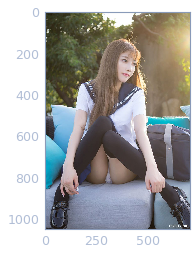

In [6]:
plt.imshow(np.asarray(Image.open('000000.jpg')))

这里要注意，预训练好的模型输入的图片大小是$224 \times 224$的，因此这里对图片重新进行缩放，另外因为MXNet的输入格式有需求，所以我们这里也做了reshape的动作。

In [7]:
data = mx.image.imresize(data, 224, 224)
data = nd.transpose(data, (2, 0, 1))
# data = data.astype(np.float32)/127.5-1
data = data.astype(np.float32)/255
data = data.reshape((1,)+data.shape)
print(data.shape)

(1, 3, 224, 224)


接下来要画的是Saliency Map。可以参考这篇[论文](https://arxiv.org/pdf/1312.6034.pdf)。实际上就是看哪个位置的梯度最大。

In [8]:
data.attach_grad()
with autograd.record():
    out = vgg19(data)
out.backward()

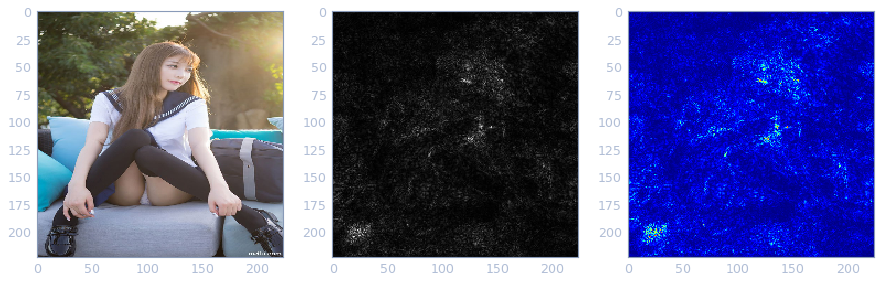

In [9]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow((data[0].asnumpy().transpose(1, 2, 0)*255).astype(np.uint8))
# plt.imshow(((data[0].asnumpy().transpose(1, 2, 0)+1)*127.5).astype(np.uint8))
plt.subplot(1, 3, 2)
plt.imshow(np.abs(data.grad.asnumpy()[0]).max(axis=0), cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(np.abs(data.grad.asnumpy()[0]).max(axis=0), cmap=plt.cm.jet)

In [10]:
data.attach_grad()
with autograd.record():
    out = resnet152(data)
out.backward()

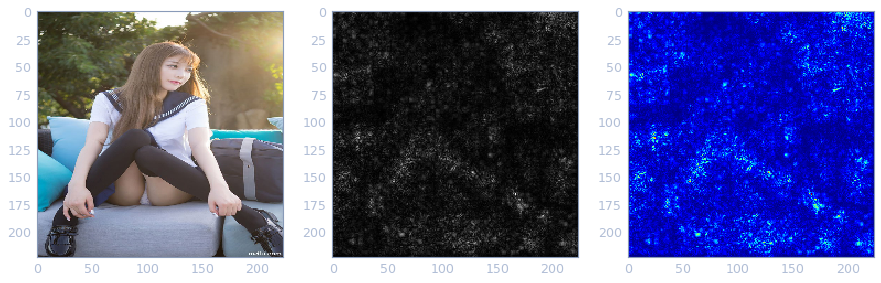

In [11]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow((data[0].asnumpy().transpose(1, 2, 0)*255).astype(np.uint8))
# plt.imshow(((data[0].asnumpy().transpose(1, 2, 0)+1)*127.5).astype(np.uint8))
plt.subplot(1, 3, 2)
plt.imshow(np.abs(data.grad.asnumpy()[0]).max(axis=0), cmap='gray')
plt.subplot(1, 3, 3)
plt.imshow(np.abs(data.grad.asnumpy()[0]).max(axis=0), cmap=plt.cm.jet)

这里有个很有意思的现象，VGG-19偏向找人的头部区域，而ResNet则是找到了腿。另外可以多试验几张图，看看效果。一般试下来VGG偏向把轮廓弄出来，ResNet就会找到各种奇奇怪怪的地方去。但是ResNet效果很好，暂时不能理解为什么。

接下来我们把filter画出来，先看一下VGG的结构。

In [12]:
print(vgg19)

VGG(
  (features): HybridSequential(
    (0): Conv2D(3 -> 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Activation(relu)
    (2): Conv2D(64 -> 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): Activation(relu)
    (4): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False)
    (5): Conv2D(64 -> 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): Activation(relu)
    (7): Conv2D(128 -> 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): Activation(relu)
    (9): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False)
    (10): Conv2D(128 -> 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): Activation(relu)
    (12): Conv2D(256 -> 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): Activation(relu)
    (14): Conv2D(256 -> 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): Activation(relu)
    (16): Conv2D(256 -> 256, kernel_size=(3, 3), stride=(1, 1), padd

把每个卷积层的权重打出来。

In [13]:
for i in vgg19.features:
    if isinstance(i, nn.Conv2D):
        j = i.weight.data()
        print(i.weight.data()[0])


[[[-0.05347426 -0.04925704 -0.06794177]
  [ 0.01531445  0.04506842  0.0021444 ]
  [ 0.03622622  0.01999945  0.01986402]]

 [[ 0.01701478  0.05540261 -0.0062293 ]
  [ 0.14164735  0.22705214  0.13758276]
  [ 0.12000094  0.2002953   0.09211431]]

 [[-0.04488515  0.01267995 -0.01449722]
  [ 0.05974238  0.13954678  0.05410246]
  [-0.00096141  0.058304   -0.02966315]]]
<NDArray 3x3x3 @cpu(0)>

[[[  5.32941446e-02   8.28036219e-02   8.55239853e-02]
  [  2.69756429e-02   3.26499827e-02   5.41443080e-02]
  [ -4.45114523e-02  -5.22579486e-03  -4.13805526e-03]]

 [[ -1.91522501e-02   2.20802501e-02   1.05948625e-02]
  [ -4.29382697e-02  -1.48948012e-02  -4.57474180e-02]
  [ -1.88105460e-02  -2.81520318e-02  -6.33606985e-02]]

 [[  4.01213542e-02   1.24526165e-01   9.83556286e-02]
  [ -3.76171321e-02   4.66622747e-02  -4.31435695e-03]
  [ -1.15180567e-01  -9.62598473e-02  -8.57684463e-02]]

 [[  2.52317800e-03   9.12922248e-03  -1.28608560e-02]
  [ -2.28658486e-02  -3.34531697e-03  -5.33336252e-0

In [14]:
j.shape

(512, 512, 3, 3)

将最后一层卷积层的第一个filter画出来，然而，完全看不出到底这个filter能起到什么效果。

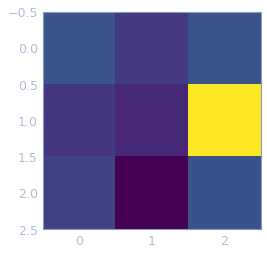

In [15]:
plt.imshow(np.abs(j[0][0].asnumpy()))

取第一层卷积层出来

In [16]:
for i in vgg19.features:
    if isinstance(i, nn.Conv2D):
        j = i
        print(i.weight.data()[0])
        break


[[[-0.05347426 -0.04925704 -0.06794177]
  [ 0.01531445  0.04506842  0.0021444 ]
  [ 0.03622622  0.01999945  0.01986402]]

 [[ 0.01701478  0.05540261 -0.0062293 ]
  [ 0.14164735  0.22705214  0.13758276]
  [ 0.12000094  0.2002953   0.09211431]]

 [[-0.04488515  0.01267995 -0.01449722]
  [ 0.05974238  0.13954678  0.05410246]
  [-0.00096141  0.058304   -0.02966315]]]
<NDArray 3x3x3 @cpu(0)>


In [17]:
j(data).shape

(1, 64, 224, 224)

看一张图片进入第一个卷积层后会得到什么样的结果

/home/samael/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


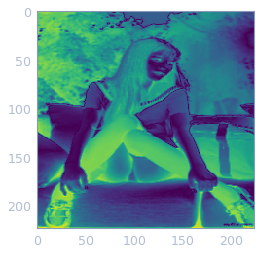

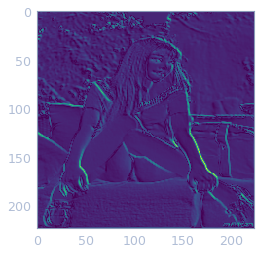

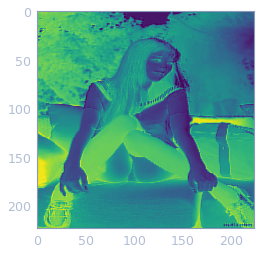

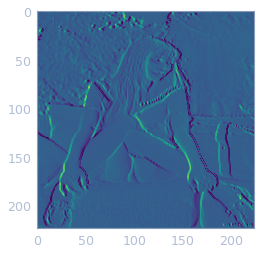

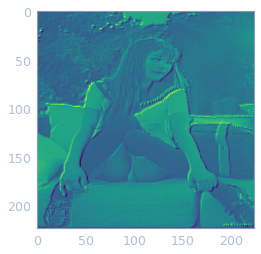

...

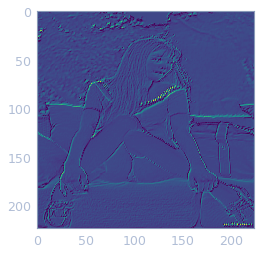

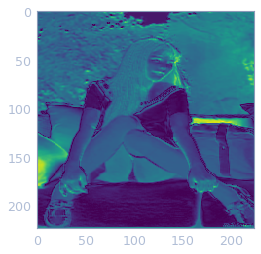

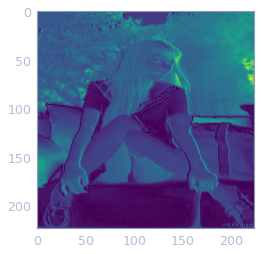

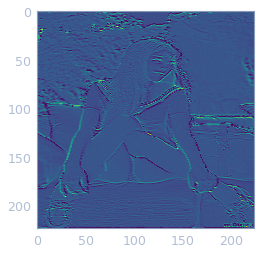

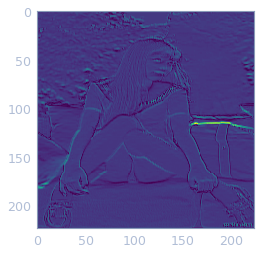

In [18]:
for num in range(64):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(np.abs(i(data)[0].asnumpy())[num])

然后，嗯，很神奇，第一个卷积的64个通道的效果都在上面。中间有一些看上去还有点像浮雕的效果。某一张嘴唇位置及其显眼。

In [19]:
sample = np.random.uniform(150, 180, (224, 224, 3))

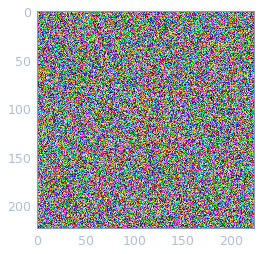

In [20]:
plt.imshow(sample)

这里生成一张充满噪声的点，再来看看每个filter在做什么。

In [21]:
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
for channel in range(3):
    sample[:, :, channel] /= 255
    sample[:, :, channel] -= mean[channel]
    sample[:, :, channel] /= std[channel]

sample = sample.reshape((1,)+sample.shape)
sample = sample.transpose(0, 3, 1, 2)
sample = nd.array(sample)

/home/samael/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


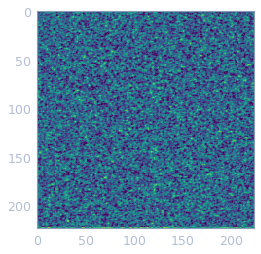

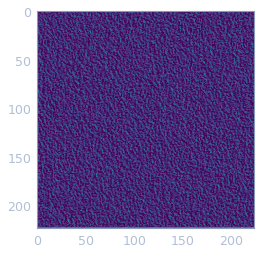

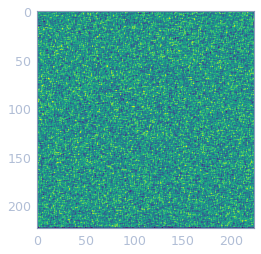

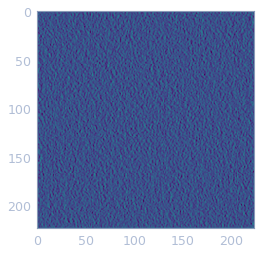

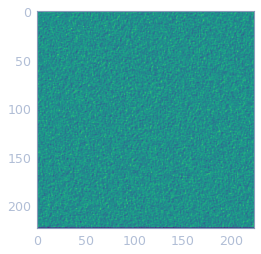

...

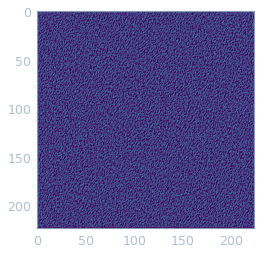

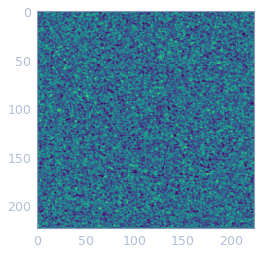

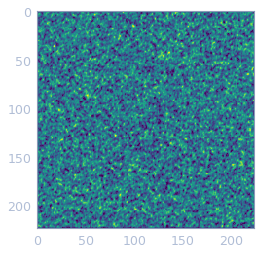

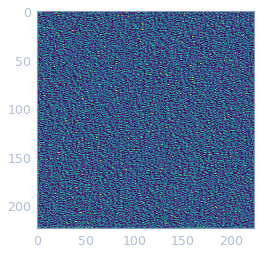

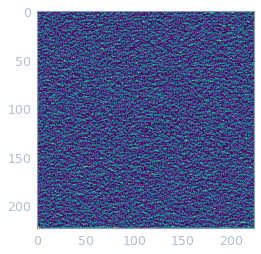

In [22]:
for num in range(64):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.imshow(np.abs(i(sample)[0].asnumpy())[num])

入门级别的CNN visualization基本上就这些了。网上没找到MXNet做这个的教程，只能自己摸索了。还好gluon跟pytorch接口很像，可以照着MXNet的源码，再借鉴pytorch的教程慢慢摸索。